<h1 align="center"><code>/gamerule doFireTick true</code></h1>
<p align="center">Brought to you by Leonardo Biason (2045751), Lorenzo Marinelli (2043092) and Oscar Michele Norelli (2046721)</p>

---

This project has been done for the Deep Learning course challenge, which asked to the course participants to build a binary classifier which should recognize whether there is some fire in a picture. We here present a possible implementation of this classifier, which reached an astonishing accuracy of $98.5\%$.

A complete paper can be found [here](https://github.com/ElBi21/doFireTick/blob/main/article/doFireTick%20Report.pdf), with all the details of the ensemble and the training process.

## 1) Imports

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets
import os
from PIL import Image
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## 2) Dataloader

In [2]:
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader
import torch
import random

# Custom Dataset to include original, flipped, and conditionally augmented flipped images
class AugmentedDataset(Dataset):
    def __init__(self, dataset, additional_transforms=None, augment_prob=0.5):
        """
        Args:
            dataset: The original dataset (e.g., ImageFolder).
            additional_transforms: Additional transformations to apply.
            augment_prob: Probability of applying secondary transformations to flipped images.
        """
        self.dataset = dataset
        self.additional_transforms = additional_transforms
        self.augment_prob = augment_prob

    def __len__(self):
        # Double the dataset size (original + flipped)
        return len(self.dataset) * 2

    def __getitem__(self, idx):
        original_idx = idx % len(self.dataset)  # Get the original image index
        is_flipped = idx >= len(self.dataset)  # Check if it's a flipped image

        image, label = self.dataset[original_idx]

        # Apply horizontal flip if needed
        if is_flipped:
            image = transforms.functional.hflip(image)

            # Randomly apply secondary transformations
            if random.random() < self.augment_prob and self.additional_transforms:
                image = self.additional_transforms(image)

        return image, label


# Define transformations
transform_original = transforms.Compose([
    transforms.ToTensor(),
])

# Define additional transformations for flipped images
additional_transforms = transforms.Compose([
    transforms.RandomRotation(degrees=15),  # Random rotation
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Random color jitter
    transforms.Lambda(lambda img: torch.clamp(img + torch.randn_like(img) * 0.07, 0.0, 1.0))  # Brightness noise
])

# Load original dataset
all_data_path = r"C:\Users\repea\Downloads\dl2425_challenge_dataset\dl2425_challenge_dataset\train"
#all_data_path = "/kaggle/input/fire-not-fire/dl2425_challenge_dataset/train"
original_dataset = datasets.ImageFolder(root=all_data_path, transform=transform_original)

# Create the augmented dataset
augmented_dataset = AugmentedDataset(
    original_dataset,
    additional_transforms=additional_transforms,
    augment_prob=0.3  # 30% of flipped images will have secondary transformations
)

# Create DataLoader
train_loader = DataLoader(augmented_dataset, batch_size=32, shuffle=True)

# Verify the DataLoader
print(f"Number of training samples (including flipped): {len(train_loader.dataset)}")


Number of training samples (including flipped): 21852


In [3]:
# Combine both datasets into one for splitting
all_data_path = r"C:\Users\repea\Downloads\dl2425_challenge_dataset\dl2425_challenge_dataset\val"
categories = ["0", "1"]

# Define transformations (resize to 224x224 and normalize)
transform = transforms.Compose([
    transforms.ToTensor(),          # Convert image to PyTorch tensor
])

# Load the dataset
dataset = datasets.ImageFolder(root=all_data_path, transform=transform)


# Create DataLoader for train and test sets
val_loader = DataLoader(dataset, batch_size=32, shuffle=True)

# Verify the dataloaders
print(f"Number of training samples: {len(val_loader.dataset)}")

Number of training samples: 3121


In [87]:
import os
import json
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class CustomTestDataset(Dataset):
    def __init__(self, image_folder, json_path, transform=None):
        """
        Args:
            image_folder (str): Path to the folder containing images.
            json_path (str): Path to the JSON file with class labels.
            transform (callable, optional): Transform to be applied to images.
        """
        self.image_folder = image_folder
        self.transform = transform

        # Load the JSON file
        with open(json_path, 'r') as f:
            self.labels = json.load(f)
        
        # Get all image file names
        self.image_files = list(self.labels.keys())

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Get image file name
        image_name = self.image_files[idx]
        
        # Load the image
        image_path = os.path.join(self.image_folder, image_name)
        image = Image.open(image_path).convert("RGB")
        
        # Apply transformations
        if self.transform:
            image = self.transform(image)
        
        # Get label
        label = self.labels[image_name]
        
        return image, label, image_name  # Include filename in the return

# Define path variables
test_image_folder = r"C:\Users\repea\Downloads\dl2425_challenge_dataset\dl2425_challenge_dataset\test"
test_json_path = r"C:\Users\repea\Downloads\annotations.json"

# Define transformations (resize to 224x224 and normalize)
transform = transforms.Compose([
    transforms.ToTensor(),          # Convert image to PyTorch tensor
])

# Create the test dataset
test_dataset = CustomTestDataset(
    image_folder=test_image_folder,
    json_path=test_json_path,
    transform=transform
)

# Create DataLoader for test set
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Verify the dataloader
print(f"Number of test samples: {len(test_loader.dataset)}")


Number of test samples: 1561


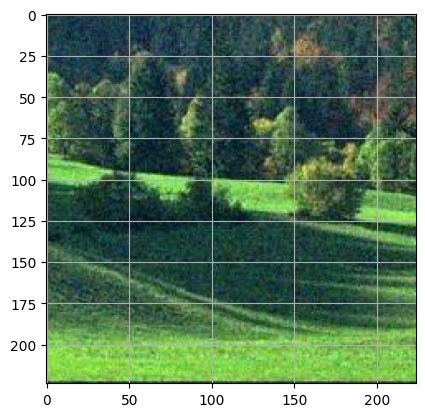

torch.Size([3, 224, 224]) tensor(0)


In [28]:
for batch in test_loader:
    # Plot the first image in the batch
    image_tensor = batch[0][0]
    image = image_tensor.permute(1, 2, 0).numpy()  # Convert to H x W x C for plotting
    plt.imshow(image)
    plt.grid(True)
    plt.axis('on')
    plt.show()
    print (image_tensor.shape, batch[1][0])
    break  # Display only one image

## 3) Focal loss

In [30]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2, reduction='mean'):
        super().__init__()
        # use standard CE loss without reducion as basis
        self.CE = nn.CrossEntropyLoss(reduction='none',)
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, input, target):
        '''
        input (B, N)
        target (B)
        '''
        CE_loss = self.CE(input, target)
        pt = torch.exp(-CE_loss) # don't forget the minus here
        focal_loss = (1-pt)**self.gamma * CE_loss

        # apply class weights
        if self.alpha != None:
            focal_loss *= self.alpha.gather(0, target)
        
        if self.reduction == 'mean':
            focal_loss = focal_loss.mean()
        elif self.reduction == 'sum':
            focal_loss = focal_loss.sum()
        return focal_loss

## 4) Model creation

In [ ]:
resnet = torchvision.models.resnet152(pretrained=True).to(device)
resnet.fc = nn.Linear(2024,1024)

class lll(nn.Module):
    """
    A complex 152 resnet with changed last layer and added subsequent
    layers, trained with cross entropy loss, AdamW with decreasing
    learning rate and data augmentation applied
    """
    def __init__(self, backbone):
        super(lll, self).__init__()
        self.backbone = backbone
        self.linear = nn.Linear(1024,512)
        self.linear2 = nn.Linear(512,2)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.relu(self.backbone(x))
        x = self.dropout(x)
        x = self.relu(self.linear(x))
        x = self.dropout(x)
        x = self.linear2(x)

        return x
    
head = lll(resnet).to(device)
optimizer = optim.AdamW(head.parameters(), lr=0.0001)
criterion = FocalLoss()

c:\Users\repea\anaconda3\envs\envu\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\repea\anaconda3\envs\envu\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


A complex 152 resnet with changed last layer and added subsequent layers, trained with cross entropy loss, AdamW with decreasing learning rate and data augmentation applied

In [ ]:
def load_checkpoint(filepath):
    checkpoint = torch.load(filepath)
    model = checkpoint['model']
    model.load_state_dict(checkpoint['state_dict'])
    for parameter in model.parameters():
        parameter.requires_grad = True

    model.eval()
    return model

head = load_checkpoint(r"C:\Users\repea\Downloads\checkpoint.pth").to(device)

C:\Users\repea\AppData\Local\Temp\ipykernel_24228\1847534309.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(filepath)


A simple resnet 18 with changed last layer, trained with focal loss, SGD with decreasing learning rate and data augmentation applied

In [ ]:
head2 = torchvision.models.resnet18(weights="ResNet18_Weights.DEFAULT").to(device)
head2.fc = nn.Linear(512,2).to(device)
head2.load_state_dict(torch.load(r"C:\Users\repea\Downloads\state_dict_18_focal.pth"))

C:\Users\repea\AppData\Local\Temp\ipykernel_24228\1842187198.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  head2.load_state_dict(torch.load(r"C:\Users\repea\Downloads\

<All keys matched successfully>

A 50 resnet with changed last layer and added subsequent layers, trained with cross entropy loss, SGD with decreasing learning rate and data augmentation **NOT** applied

In [ ]:
head3 = torchvision.models.resnet50(weights="ResNet50_Weights.DEFAULT").to(device)
head3.fc = nn.Linear(2048,2).to(device)
head3.load_state_dict(torch.load(r"C:\Users\repea\Downloads\state_dict_50_cross.pth"))

C:\Users\repea\AppData\Local\Temp\ipykernel_24228\3195882575.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  head3.load_state_dict(torch.load(r"C:\Users\repea\Downloads\

<All keys matched successfully>

## 5) Training & testing of the model

In [67]:
def train_model(model, train_loader, optimizer, criterion, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()  # Zero the gradients
            inputs = rgb2stef(inputs.permute(0,2,3,1)).permute(0,3,1,2)
            outputs = model(inputs.to(device))  # Forward pass
            loss = criterion(outputs, labels.to(device))  # Compute loss
            loss.backward()  # Backward pass
            optimizer.step()  # Update weights
            running_loss += loss.item()
            print ("ok")
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")



# Train the model
train_model(head,train_loader, optimizer, criterion)

NameError: name 'train_loader' is not defined

In [125]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class EnsembleModel(nn.Module):
    def __init__(self, model1, model2, model3, mode="average"):
        """
        Ensemble model that combines predictions from models.
        
        Args:
            model1: First model.
            model2: Second model.
            model3: Third model.
            mode: How to combine predictions ('average', 'weighted', 'vote').
        """
        super(EnsembleModel, self).__init__()
        self.model1 = model1
        self.model2 = model2
        self.model3 = model3
        self.mode = mode

    def forward(self, x):
        # Get predictions (logits) from the models
        output1 = self.model1(x)
        output2 = self.model2(x)
        output3 = self.model3(x)

        if self.mode == "average":
            # Combine outputs using simple averaging
            return (output1 + output2 + output3) / 3
        elif self.mode == "weighted":
            # Example of weighted averaging
            w1, w2, w3 = 0.5, 0.3, 0.2  # Example weights
            return w1 * output1 + w2 * output2 + w3 * output3
        elif self.mode == "vote":
            # Majority voting
            # Get predicted class indices from each model
            pred1 = torch.argmax(output1, dim=1)
            pred2 = torch.argmax(output2, dim=1)
            pred3 = torch.argmax(output3, dim=1)

            # Stack predictions and compute majority vote
            preds = torch.stack([pred1, pred2, pred3], dim=0)  # Shape: (3, batch_size)
            majority_vote, _ = torch.mode(preds, dim=0)  # Majority vote along the model axis
            
            return majority_vote  # Return class indices directly
        else:
            raise ValueError("Unsupported combination mode!")
        
# Example usage
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load your two models
model1 = head
model2 = head2
model3 = head3

# Move models to device
model1.to(device)
model2.to(device)
model3.to(device)

# Set models to evaluation mode (important for inference)
model1.eval()
model2.eval()
model3.eval()

# Create the ensemble model
ensemble_model = EnsembleModel(model1, model2, model3, mode="vote")
ensemble_model.to(device)


EnsembleModel(
  (model1): lll(
    (linear): Linear(in_features=1024, out_features=512, bias=True)
    (linear2): Linear(in_features=512, out_features=2, bias=True)
    (backbone): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=

In [126]:
def test_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels.to(device)).sum().item()
        print(f"Test Accuracy: {100 * correct / total}%")

test_model(ensemble_model, val_loader)

IndexError: Dimension out of range (expected to be in range of [-1, 0], but got 1)

In [119]:
import torch.nn.functional as F

def test_model(model, test_loader, save_path):
    """
    Tests the model and saves misclassified images' details.
    
    Args:
        model: The PyTorch model to test.
        test_loader: DataLoader for the test dataset.
        save_path: Path to save the misclassified image details.
    """
    model.eval()
    correct = 0
    total = 0
    misclassified = []  # List to store details of misclassified images

    with torch.no_grad():
        for inputs, labels, filenames in test_loader:  # Receive filenames from the dataset
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probabilities = F.softmax(outputs, dim=1)  # Calculate probabilities
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Store details of misclassified samples
            for i in range(len(labels)):
                if predicted[i] != labels[i]:
                    misclassified.append({
                        "filename": filenames[i],
                        "true_label": labels[i].item(),
                        "predicted_label": predicted[i].item(),
                        "probabilities": probabilities[i].tolist()
                    })
        
        # Save misclassified samples to a file
        with open(save_path, 'w') as f:
            json.dump(misclassified, f, indent=4)

    print(f"Test Accuracy: {100 * correct / total}%")
    print(f"Misclassified samples saved to {save_path}")

# Example usage
save_path = "misclassified_samples.json"
test_model(ensemble_model, test_loader, save_path)


Test Accuracy: 97.30941704035874%
Misclassified samples saved to misclassified_samples.json


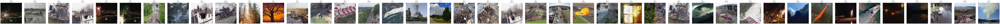

In [120]:
import matplotlib.pyplot as plt
import json
from PIL import Image
import os

def plot_misclassified_samples(json_path, image_folder, n_samples=5):
    """
    Plots a limited number of misclassified images with their true label,
    predicted label, and probability scores.

    Args:
        json_path (str): Path to the JSON file containing misclassified image details.
        image_folder (str): Path to the folder containing images.
        n_samples (int): Number of samples to plot.
    """
    # Load misclassified samples from the JSON file
    with open(json_path, 'r') as f:
        misclassified = json.load(f)
    
    # Limit the number of samples to plot
    n_samples = min(n_samples, len(misclassified))  # Ensure we don't exceed available samples
    misclassified = misclassified[:n_samples]

    # Set up the plot
    fig, axes = plt.subplots(1, n_samples, figsize=(5 * n_samples, 5))  # Dynamically adjust figure size
    if n_samples == 1:
        axes = [axes]  # Ensure axes is iterable for a single image

    for ax, sample in zip(axes, misclassified):
        # Load the image
        image_path = os.path.join(image_folder, sample["filename"])
        image = Image.open(image_path)

        # Extract details
        true_label = sample["true_label"]
        predicted_label = sample["predicted_label"]
        probabilities = sample["probabilities"]

        # Plot the image
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(
            f"True: {true_label}\nPred: {predicted_label}\nProb: {max(probabilities):.2f}",
            fontsize=10
        )

    plt.tight_layout()
    plt.show()

# Example usage
json_path = "misclassified_samples.json"
image_folder = r"C:\Users\repea\Downloads\dl2425_challenge_dataset\dl2425_challenge_dataset\test"
plot_misclassified_samples(json_path, image_folder, n_samples=50)
